<a href="https://colab.research.google.com/github/TasnimLahmar/Breast_Cancer_detection/blob/main/try_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Libraries**

In [2]:
import os
import shutil
import random
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import zipfile
import json
from collections import defaultdict
import pprint
import matplotlib.pyplot as plt

In [3]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.63 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/107.7 GB disk)


In [ ]:
pip install opencv-python matplotlib

In [ ]:
# Run inference on an image with YOLOv8n
!yolo predict model=yolov8n.pt source='https://ultralytics.com/images/zidane.jpg'

100% 6.25M/6.25M [00:00<00:00, 101MB/s]
Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

100% 49.2k/49.2k [00:00<00:00, 7.61MB/s]
image 1/1 /content/zidane.jpg: 384x640 2 persons, 1 tie, 253.2ms
Speed: 16.2ms preprocess, 253.2ms inference, 1308.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/lot4.zip", 'r')
zip_ref.extractall("/content/drive/MyDrive/lot4_before")
zip_ref.close()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/lot4.zip'

**Data analysis**

In [ ]:
with open('/content/drive/MyDrive/lot4.json') as file:
    data = json.load(file)

pprint.pprint(data[:4])

[{'annotations': [{'completed_by': 1,
                   'created_at': '2024-07-09T03:37:58.888190Z',
                   'draft_created_at': None,
                   'ground_truth': False,
                   'id': 17324,
                   'import_id': 15517,
                   'last_action': None,
                   'last_created_by': None,
                   'lead_time': 128.087,
                   'parent_annotation': None,
                   'parent_prediction': None,
                   'prediction': {},
                   'project': 148,
                   'result': [{'from_name': 'label',
                               'id': '-KH41GZo1O',
                               'image_rotation': 0,
                               'origin': 'manual',
                               'original_height': 1088,
                               'original_width': 680,
                               'to_name': 'image',
                               'type': 'polygonlabels',
                           

In [ ]:

image_directory = '/content/drive/MyDrive/lot4_before/images/'
files = os.listdir(image_directory)
file_count = len(files)

print(f'There are {file_count} files in the directory.')

There are 1896 files in the directory.


**Occurences of labels**

In [ ]:
def count_polygonlabels(data):
    label_counts = defaultdict(int)

    for entry in data:
        annotations = entry.get('annotations', [])
        for annotation in annotations:
            results = annotation.get('result', [])
            for result in results:
                if result.get('type') == 'polygonlabels':
                    labels = result['value'].get('polygonlabels', [])
                    for label in labels:
                        label_counts[label] += 1

    return label_counts

In [ ]:
label_counts = count_polygonlabels(data)
print("Occurrences of each polygon label:")
for label, count in label_counts.items():
    print(f"{label}: {count}")

Occurrences of each polygon label:
health_stamp: 1161
expiration_date: 3385
batch_number: 2141
product_name: 1889


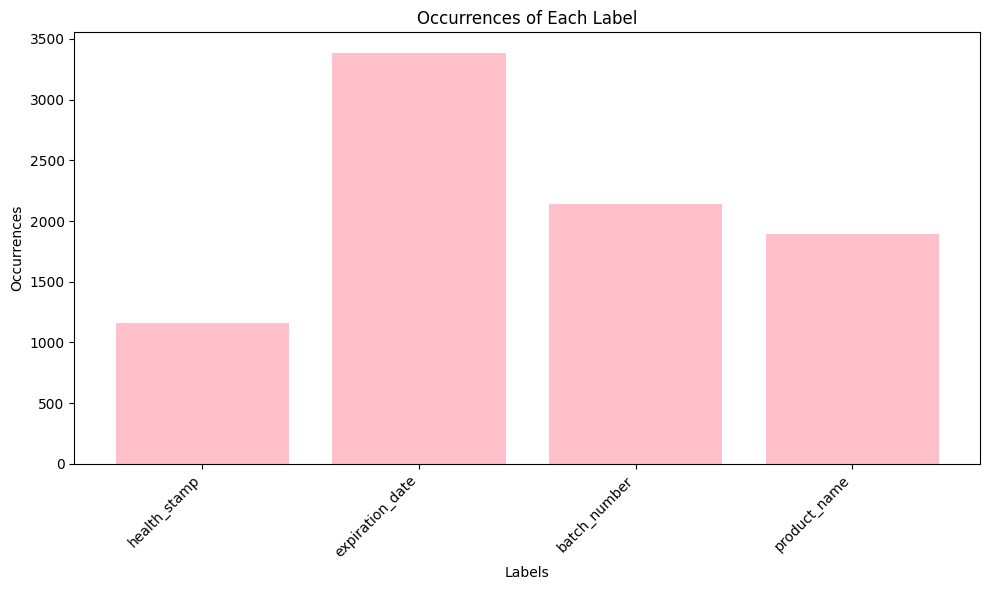

In [ ]:
def plot_histogram(label_counts):
    labels = list(label_counts.keys())
    counts = list(label_counts.values())

    plt.figure(figsize=(10, 6))
    plt.bar(labels, counts, color='pink')
    plt.xlabel('Labels')
    plt.ylabel('Occurrences')
    plt.title('Occurrences of Each Label')
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()
plot_histogram(label_counts)

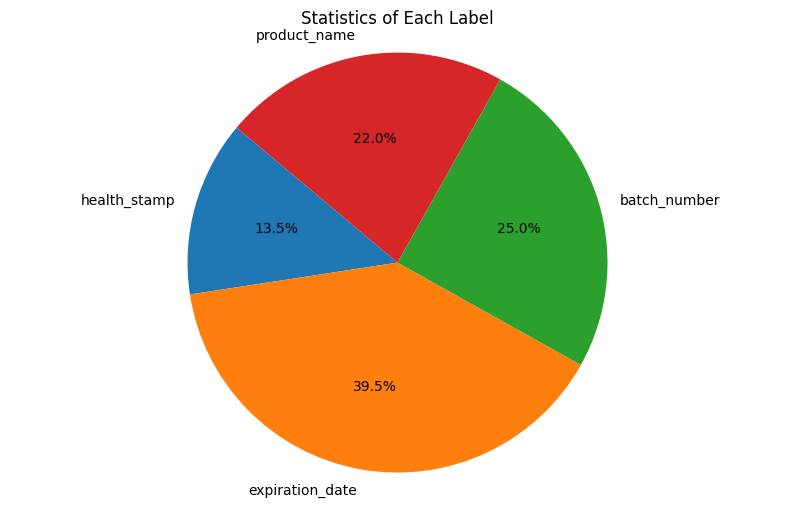

In [ ]:
def plot_pie_chart(label_counts):
    labels = list(label_counts.keys())
    counts = list(label_counts.values())

    plt.figure(figsize=(10, 6))
    plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title('Statistics of Each Label')
    plt.axis('equal')
    plt.show()
plot_pie_chart(label_counts)


In [ ]:
print(label_counts)

defaultdict(<class 'int'>, {'health_stamp': 1161, 'expiration_date': 3385, 'batch_number': 2141, 'product_name': 1889})


In [ ]:
def count_polygonlabels_per_entry(data):
    entry_label_counts = {}

    for entry in data:
        entry_id = entry.get('id')
        label_counts = defaultdict(int)

        annotations = entry.get('annotations', [])
        for annotation in annotations:
            results = annotation.get('result', [])
            for result in results:
                if result.get('type') == 'polygonlabels':
                    labels = result['value'].get('polygonlabels', [])
                    for label in labels:
                        label_counts[label] += 1

        entry_label_counts[entry_id] = dict(label_counts)

    return entry_label_counts


entry_label_counts = count_polygonlabels_per_entry(data)

print(entry_label_counts)

{20622: {'health_stamp': 2, 'expiration_date': 4, 'batch_number': 1, 'product_name': 1}, 20623: {'expiration_date': 1, 'batch_number': 1}, 20624: {'expiration_date': 1, 'health_stamp': 1, 'product_name': 1}, 20625: {'health_stamp': 1, 'product_name': 1, 'batch_number': 1, 'expiration_date': 4}, 20626: {'expiration_date': 2, 'batch_number': 2, 'product_name': 1, 'health_stamp': 1}, 20627: {'product_name': 2, 'expiration_date': 1, 'batch_number': 1, 'health_stamp': 1}, 20628: {'product_name': 1, 'expiration_date': 1, 'batch_number': 1}, 20629: {'expiration_date': 2, 'batch_number': 1}, 20630: {'batch_number': 1, 'expiration_date': 1, 'product_name': 2, 'health_stamp': 1}, 20631: {'expiration_date': 1, 'product_name': 1}, 20632: {'product_name': 3, 'expiration_date': 2, 'batch_number': 2}, 20633: {'batch_number': 1, 'expiration_date': 1, 'product_name': 1}, 20634: {'product_name': 2, 'expiration_date': 2, 'batch_number': 2}, 20635: {'product_name': 1, 'expiration_date': 2, 'batch_number':

**Maximum of labels in each image**

In [ ]:
def find_max_label_counts(data):
    entry_label_counts = count_polygonlabels_per_entry(data)
    max_label_counts = {}
    overall_max_counts = defaultdict(int)

    for entry_id, label_counts in entry_label_counts.items():
        for label, count in label_counts.items():
            if label not in max_label_counts or count > max_label_counts[label]:
                max_label_counts[label] = count
            if count > overall_max_counts[label]:
                overall_max_counts[label] = count

    return max_label_counts, dict(overall_max_counts)
max_label_counts, overall_max_counts = find_max_label_counts(data)

print("Maximum occurrences of each polygon label per entry:")
for entry_id, label_counts in max_label_counts.items():
    print(f"{entry_id}: {label_counts}")

Maximum occurrences of each polygon label per entry:
health_stamp: 3
expiration_date: 8
batch_number: 4
product_name: 4


**Minimum of labels in each image**

In [ ]:
def find_min_label_counts(data):
    entry_label_counts = count_polygonlabels_per_entry(data)
    min_label_counts = {}
    overall_min_counts = {
        'expiration_date': float('inf'),
        'batch_number': float('inf'),
        'product_name': float('inf'),
        'health_stamp': float('inf')
    }

    for entry_id, label_counts in entry_label_counts.items():
        for label in ['expiration_date', 'batch_number', 'product_name', 'health_stamp']:
            count = label_counts.get(label, 0)
            if label not in min_label_counts or count < min_label_counts[label]:
                min_label_counts[label] = count
            if count < overall_min_counts[label]:
                overall_min_counts[label] = count

    return min_label_counts, overall_min_counts

min_label_counts, overall_min_counts = find_min_label_counts(data)

print("Minimum occurrences of each polygon label per entry:")
for label, count in min_label_counts.items():
    print(f"{label}: {count}")


Minimum occurrences of each polygon label per entry:
expiration_date: 0
batch_number: 0
product_name: 0
health_stamp: 0


** Average of labels in all data**

In [ ]:
def calculate_average_of_averages(data):
    entry_label_counts = count_polygonlabels_per_entry(data)
    num_entries = len(entry_label_counts)

    sum_of_averages = 0.0

    for entry_id, label_counts in entry_label_counts.items():
        total_labels = sum(label_counts.values())
        average_entry = total_labels / 4.0
        sum_of_averages += average_entry

    overall_average = sum_of_averages / num_entries if num_entries > 0 else 0.0

    return overall_average

In [ ]:

overall_average = calculate_average_of_averages(data)

print(f"Overall average of labels: {overall_average}")

Overall average of labels: 1.0741482965931863


In [ ]:
def check_empty_entries(data):
    entry_label_counts = count_polygonlabels_per_entry(data)
    empty_entries = []

    for entry_id, label_counts in entry_label_counts.items():
        total_labels = sum(label_counts.values())
        if total_labels == 0:
            empty_entries.append(entry_id)

    return empty_entries


empty_entries = check_empty_entries(data)

if empty_entries:
    print(f"ID of images with no labels: {empty_entries}")
else:
    print("All entries have at least one label.")

ID of images with no labels: [21561, 22440]


**unlabeled data**

21561
/content/drive/MyDrive/lot4/images/c8577eb2-2ybez8rfd7.jpg


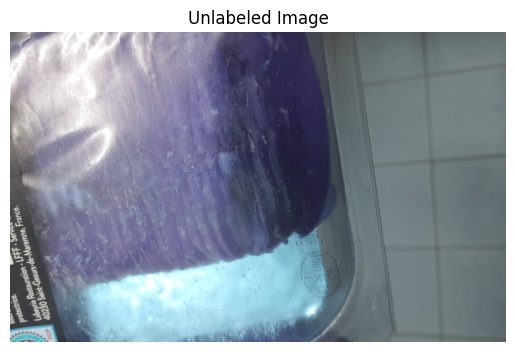

22440
/content/drive/MyDrive/lot4/images/6dc38e41-6n1kn2a61d.jpg


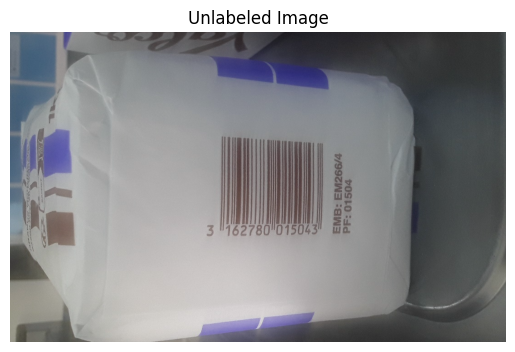

In [ ]:
def display_images(data, empty_entries):
    for entry in data:
        if entry.get('id') in empty_entries:
            image_data = entry.get('data', {}).get('image')
            print(entry.get('id'))
            image_path="/content/drive/MyDrive/lot4/images/"+ image_data.split('/')[4]
            print(image_path)
            image = cv2.imread(image_path,cv2.IMREAD_UNCHANGED)
            plt.figure()
            plt.imshow(image)
            plt.title('Unlabeled Image')
            plt.axis('off')
            plt.show()

display_images(data, empty_entries)

In [ ]:
with open('/content/drive/MyDrive/lot4/labels/c8577eb2-2ybez8rfd7.txt', 'r') as file:
    content = file.read()
    print(content)


In [ ]:
with open('/content/drive/MyDrive/lot4_before/labels/6dc38e41-6n1kn2a61d.txt', 'r') as file:
    content = file.read()
    print(content)

In [ ]:
with open('/content/drive/MyDrive/lot4/train/labels/0011ccbf-4br68isg3i.txt', 'r') as file:
    content = file.read()
    print(content)

1 0.5242876048930575 0.21818917168118618 0.8445468522371119 0.2367280572003789 0.8514989343068093 0.24889420082234917 0.8413025472712533 0.27032978720391576 0.5159451064094207 0.25294958202967255



**Delete unlabeled images along with their corresponding txt files**

In [ ]:
folder_path = "/content/drive/MyDrive/lot4_before/labels"

for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    image_path='/content/drive/MyDrive/lot4_before/reseized_images/'+filename.split('.')[0]+'.jpg'
    if os.path.isfile(file_path) and os.path.getsize(file_path) == 0:
        os.remove(file_path)
        os.remove(image_path)

        print(f"Deleted empty file: {filename}")


In [ ]:
image_path='/content/drive/MyDrive/lot4_before/reseized_images/6dc38e41-6n1kn2a61d.jpg'
os.remove(image_path)
print("Image deleted successfully.")


Image deleted successfully.


In [ ]:

image_directory = '/content/drive/MyDrive/lot4_before/reseized_images/'
files = os.listdir(image_directory)
file_count = len(files)

print(f'There are {file_count} images in the directory.')


txt_dir= '/content/drive/MyDrive/lot4_before/labels/'
files = os.listdir(image_directory)
file_count = len(files)

print(f'There are {file_count} files in the directory.')

There are 1897 images in the directory.
There are 1897 files in the directory.


**Resize all images**

In [ ]:
from PIL import Image
import os


image_size = (640, 640)
input_directory = '/content/drive/MyDrive/lot4/images'
output_directory = '/content/drive/MyDrive/lot4/resized_images'
os.makedirs(output_directory, exist_ok=True)
for filename in os.listdir(input_directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        img_path = os.path.join(input_directory, filename)
        img = Image.open(img_path)
        img_resized = img.resize(image_size)

        output_path = os.path.join(output_directory, filename)
        img_resized.save(output_path)
        print(f"Resized and saved {filename} to {output_directory}")

print("Image resizing complete.")


Resized and saved 7b0e88c9-5n2tz2ge6t.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7b1a68de-2xw3kpew1t.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7b2ecb83-1fbtjcf1j4.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7b7d1ab1-01ex7zskqh.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7bb596f4-5mqoa7pp3t.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7bbb81df-1u916m63j9.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7c0fe32e-2vjnd80a61.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7c3056ed-2wpjtuoo6u.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7c3cccdb-2b79b3u54d.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7c43b3ec-2je8cg7ta0.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7c60f1ae-0mz8evszcc.jpg to /content/drive/MyDrive/lot4/resized_images
Resized and saved 7caabecf-4x6vo

In [ ]:
with open('/content/drive/MyDrive/lot4/dataset_split/train/labels/d7282696-6rtaihqwm7.txt', 'r') as file:
    content = file.read()
    print(content)

2 0.518278814476489 0.5181810063031952 0.5176758592950791 0.5513435412807417 0.6322373437629668 0.548328765373692 0.6129427779578489 0.5189347002799576
1 0.6700897858883685 0.6736127059976657 0.7956443073912283 0.6707359476129262 0.7994799852375479 0.6832019006134646 0.6657426843292065 0.6852795594468879
1 0.6731583635361923 0.6990240746837934 0.798712885039052 0.6961473162990539 0.8025485628853717 0.7086132692995923 0.6688112619770302 0.7106909281330155
0 0.6693226503191047 0.6879964979213641



In [ ]:
# Read the file and remove the last line
with open('/content/drive/MyDrive/lot4/dataset_split/train/labels/d7282696-6rtaihqwm7.txt', 'r') as file:
    lines = file.readlines()

# Write back all lines except the last one
with open('/content/drive/MyDrive/lot4/dataset_split/train/labels/d7282696-6rtaihqwm7.txt', 'w') as file:
    file.writelines(lines[:-1])


In [ ]:
with open('/content/drive/MyDrive/lot4/dataset_split/train/labels/d7282696-6rtaihqwm7.txt', 'r') as file:
    content = file.read()
    print(content)

2 0.518278814476489 0.5181810063031952 0.5176758592950791 0.5513435412807417 0.6322373437629668 0.548328765373692 0.6129427779578489 0.5189347002799576
1 0.6700897858883685 0.6736127059976657 0.7956443073912283 0.6707359476129262 0.7994799852375479 0.6832019006134646 0.6657426843292065 0.6852795594468879
1 0.6731583635361923 0.6990240746837934 0.798712885039052 0.6961473162990539 0.8025485628853717 0.7086132692995923 0.6688112619770302 0.7106909281330155



In [ ]:
random.seed(42)

base_path = '/content/drive/MyDrive/lot4_before'
images_path = os.path.join(base_path, 'reseized_images')
labels_path = os.path.join(base_path, 'labels')

train_ratio = 0.70
val_ratio = 0.15
test_ratio = 0.15

for set_type in ['train', 'val', 'test']:
    for content_type in ['images', 'labels']:
        os.makedirs(os.path.join('/content/drive/MyDrive/lot4/dataset_split', set_type, content_type), exist_ok=True)

all_files = [f for f in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, f))]
random.shuffle(all_files)

total_files = len(all_files)
train_end = int(train_ratio * total_files)
val_end = train_end + int(val_ratio * total_files)

train_files = all_files[:train_end]
val_files = all_files[train_end:val_end]
test_files = all_files[val_end:]

def copy_files(files, set_type):
    for file in files:
        shutil.copy(os.path.join(images_path, file), os.path.join('/content/drive/MyDrive/lot4/dataset_split', set_type, 'images'))

        label_file = file.rsplit('.', 1)[0] + '.txt'
        shutil.copy(os.path.join(labels_path, label_file), os.path.join('/content/drive/MyDrive/lot4/dataset_split', set_type, 'labels'))
copy_files(train_files, 'train')
copy_files(val_files, 'val')
copy_files(test_files, 'test')

print("Dataset successfully split into train, val, and test sets.")


Dataset successfully split into train, val, and test sets.


In [ ]:

image_directory = '/content/drive/MyDrive/lot4/dataset_split/test/images'
files = os.listdir(image_directory)
file_count = len(files)

print(f'There are {file_count} images in the directory.')

There are 285 images in the directory.


In [ ]:
image_path='/content/drive/MyDrive/lot4/dataset_split/train/images/6dc38e41-6n1kn2a61d.jpg'
os.remove(image_path)
print("Image deleted successfully.")

Image deleted successfully.


In [ ]:
folder_path = "/content/drive/MyDrive/lot4/dataset_split/train/images"

for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    txt_path='/content/drive/MyDrive/lot4/dataset_split/train/labels/'+filename.split('.')[0]+'.txt'
    if not os.path.exists(txt_path):
      print(file_path)



# Convert_Polygon_to_YOLO_annotations

In [ ]:
import cv2
import shapely.wkt
import shapely.geometry
import matplotlib.pyplot as plt

# Function to convert polygon coordinates to WKT string
def polygon_to_wkt(polygon):
    points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
    return shapely.geometry.Polygon(points).wkt

# Function to convert WKT polygon to YOLO format
def polygon_to_yolo(polygon_wkt, img_width, img_height):
    p = shapely.wkt.loads(polygon_wkt)
    x, y = p.centroid.x, p.centroid.y
    w, h = p.bounds[2] - p.bounds[0], p.bounds[3] - p.bounds[1]
    return x , y, w, h




In [ ]:
# Function to save YOLO annotations
def save_yolo_annotations(output_dir, filename, bboxes, class_ids):
    with open(os.path.join(output_dir, filename), 'w') as file:
        for bbox, class_id in zip(bboxes, class_ids):
            x_center, y_center, bbox_width, bbox_height = bbox
            file.write(f"{class_id} {x_center} {y_center} {bbox_width} {bbox_height}\n")

# Paths to your dataset
image_dir = '/content/drive/MyDrive/lot4/dataset_split/test/images'
label_dir = '/content/drive/MyDrive/lot4/dataset_split/test/predicted_labels'
output_dir = '/content/drive/MyDrive/lot4/dataset_split/test/predicted_yolo_labels'

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Iterate over all images
for filename in os.listdir(image_dir):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(image_dir, filename)
        label_path = os.path.join(label_dir, filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'))

        # Load image
        img = cv2.imread(img_path)
        height, width, _ = img.shape

        # List to hold bounding boxes and class IDs
        bboxes = []
        class_ids = []

        # Read the label file and get the YOLO bbox
        with open(label_path, 'r') as file:
            lines = file.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) > 1: # Check if annotation is not empty
                class_id = parts[0]
                polygon = list(map(float, parts[1:]))


                if len(polygon) >= 8: # Check if polygon has at least 4 coordinates
                    # Convert polygon to WKT
                    polygon_wkt = polygon_to_wkt(polygon)


                    # Convert WKT polygon to YOLO format
                    yolo_bbox = polygon_to_yolo(polygon_wkt, width, height)


                    # Store the bbox and class ID
                    bboxes.append(yolo_bbox)
                    class_ids.append(class_id)
                else:
                    print(f"Skipping annotation in {filename} due to insufficient coordinates: {polygon}")
            else:
                print(f"Skipping empty annotation in {filename}")

        # Save YOLO annotations
        save_yolo_annotations(output_dir, filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'), bboxes, class_ids)

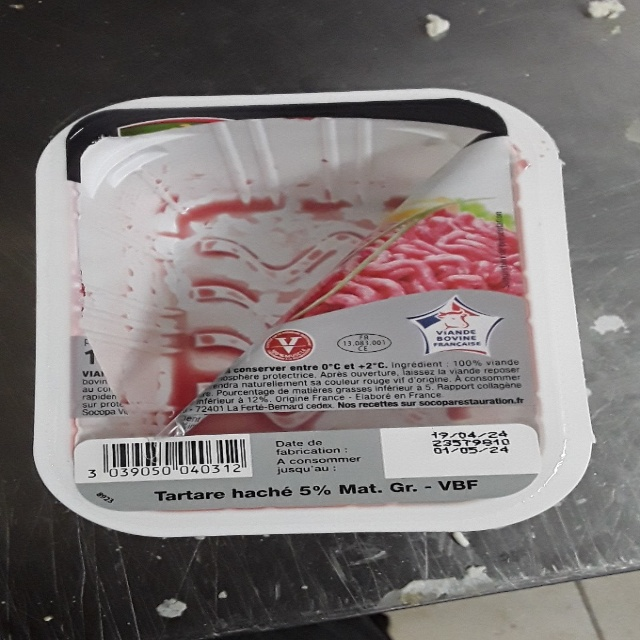

In [ ]:
img=cv2.imread('/content/drive/MyDrive/lot4/dataset_split/train/images/d7282696-6rtaihqwm7.jpg')
cv2_imshow(img)

In [ ]:
image_directory = '/content/drive/MyDrive/lot4/dataset_split/test/predicted_yolo_labels'
files = os.listdir(image_directory)
file_count = len(files)

print(f'There are {file_count} files in the directory.')

There are 285 files in the directory.


YOLO BBox: [0.7744605375441274, 0.5661045496559983, 0.09531247615814209, 0.03281247615814209]
YOLO BBox: [0.5102536910134452, 0.447763638120075, 0.08906251192092901, 0.03125]
YOLO BBox: [0.29975571215258, 0.37950650028614596, 0.12812498211860648, 0.015625]
YOLO BBox: [0.5134138091395956, 0.5433954862639826, 0.1328124701976776, 0.015625]
YOLO BBox: [0.4432949044518398, 0.31986611243153296, 0.14062500000000006, 0.020312517881393488]
YOLO BBox: [0.6893484395273011, 0.5389476124596924, 0.06406253576278687, 0.00937497615814209]
YOLO BBox: [0.3031200072218779, 0.5160035158182779, 0.13906249403953552, 0.01406252384185791]
YOLO BBox: [0.31249323276857094, 0.4134292106662061, 0.06562501192092896, 0.015625]
YOLO BBox: [0.4287067775059284, 0.4113336703165979, 0.03437501192092901, 0.0078125]
Class ID: 2, x1: 465, y1: 351, x2: 526, y2: 372
Class ID: 2, x1: 298, y1: 276, x2: 355, y2: 296
Class ID: 1, x1: 150, y1: 237, x2: 232, y2: 247
Class ID: 1, x1: 286, y1: 342, x2: 371, y2: 352
Class ID: 3, x1: 

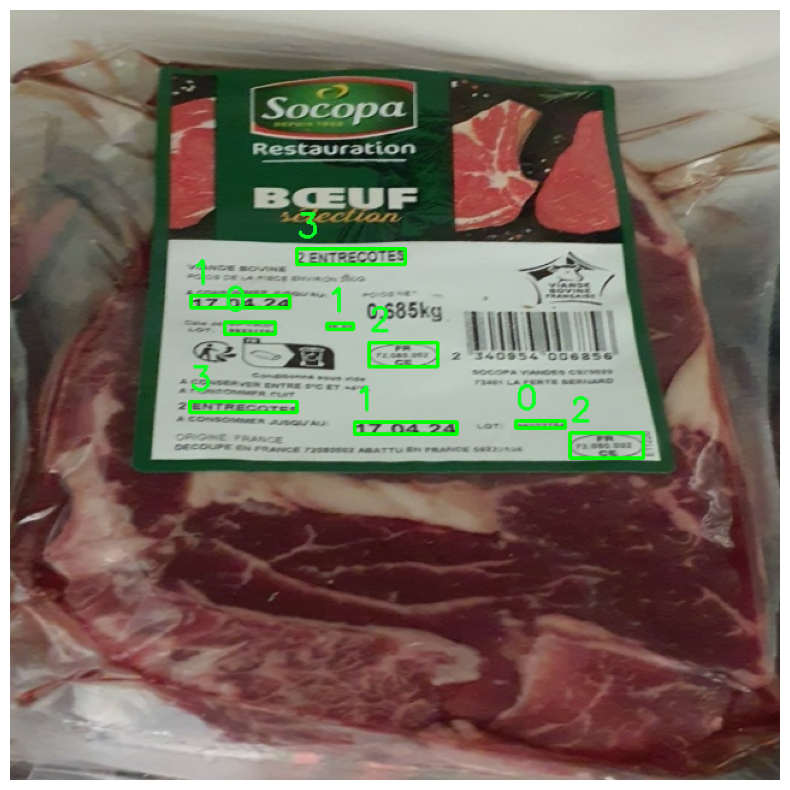

In [ ]:
# Function to show image using Matplotlib
def show_image_with_bbox(img, bboxes, class_ids):
    for bbox, class_id in zip(bboxes, class_ids):
        x_center, y_center, bbox_width, bbox_height = bbox

        # Convert YOLO format to corner coordinates
        x1 = int((x_center - bbox_width / 2) * img.shape[1])
        y1 = int((y_center - bbox_height / 2) * img.shape[0])
        x2 = int((x_center + bbox_width / 2) * img.shape[1])
        y2 = int((y_center + bbox_height / 2) * img.shape[0])

        print(f"Class ID: {class_id}, x1: {x1}, y1: {y1}, x2: {x2}, y2: {y2}")

        # Draw the bounding box on the image
        cv2.rectangle(img, (x2, y2), (x1, y1), (0, 255, 0), 2)
        cv2.putText(img, class_id, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)

    # Convert BGR to RGB for Matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

# Load image
img_path = '/content/drive/MyDrive/lot4/dataset_split/test/images/013ebaf4-2tzbhw1d5o.jpg'
img = cv2.imread(img_path)
height, width, _ = img.shape

# List to hold bounding boxes and class IDs
bboxes = []
class_ids = []

# Read the label file and get the YOLO bbox
with open('/content/drive/MyDrive/lot4/dataset_split/test/predicted_yolo_labels/013ebaf4-2tzbhw1d5o.txt', 'r') as file:
    lines = file.readlines()

for line in lines:
    parts = line.strip().split()
    class_id = parts[0]
    yolo_bbox = list(map(float, parts[1:]))


    print(f"YOLO BBox: {yolo_bbox}")

    # Store the bbox and class ID
    bboxes.append(yolo_bbox)
    class_ids.append(class_id)

# Show the image with bounding boxes
show_image_with_bbox(img, bboxes, class_ids)

In [ ]:
pip install yolov8


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.4/953.4 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 802.9/802.9 kB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.6/113.6 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 70.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')
model.train(data='/content/drive/MyDrive/lot4/data.yaml', epochs=100, imgsz=640, batch=16,device='cuda')

100%|██████████| 21.5M/21.5M [00:00<00:00, 152MB/s]


Ultralytics YOLOv8.2.60 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/lot4/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf

100%|██████████| 755k/755k [00:00<00:00, 68.9MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 135MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/.shortcut-targets-by-id/1v57GipX1s0AQow6MM0ksCJG1jTcL3kzE/lot4/dataset_split/train/labels... 1480 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1480/1480 [19:27<00:00,  1.27it/s]

train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1v57GipX1s0AQow6MM0ksCJG1jTcL3kzE/lot4/dataset_split/train/images/61e7318e-2wmn5m5zbm.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1v57GipX1s0AQow6MM0ksCJG1jTcL3kzE/lot4/dataset_split/train/images/a62844d4-6pbic1b5jx.jpg: 1 duplicate labels removed


train: New cache created: /content/drive/.shortcut-targets-by-id/1v57GipX1s0AQow6MM0ksCJG1jTcL3kzE/lot4/dataset_split/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/.shortcut-targets-by-id/1v57GipX1s0AQow6MM0ksCJG1jTcL3kzE/lot4/dataset_split/val/labels.cache... 284 images, 0 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       4.3G      2.255      3.731       1.67        135        640:  42%|████▏     | 39/93 [00:24<00:23,  2.33it/s]

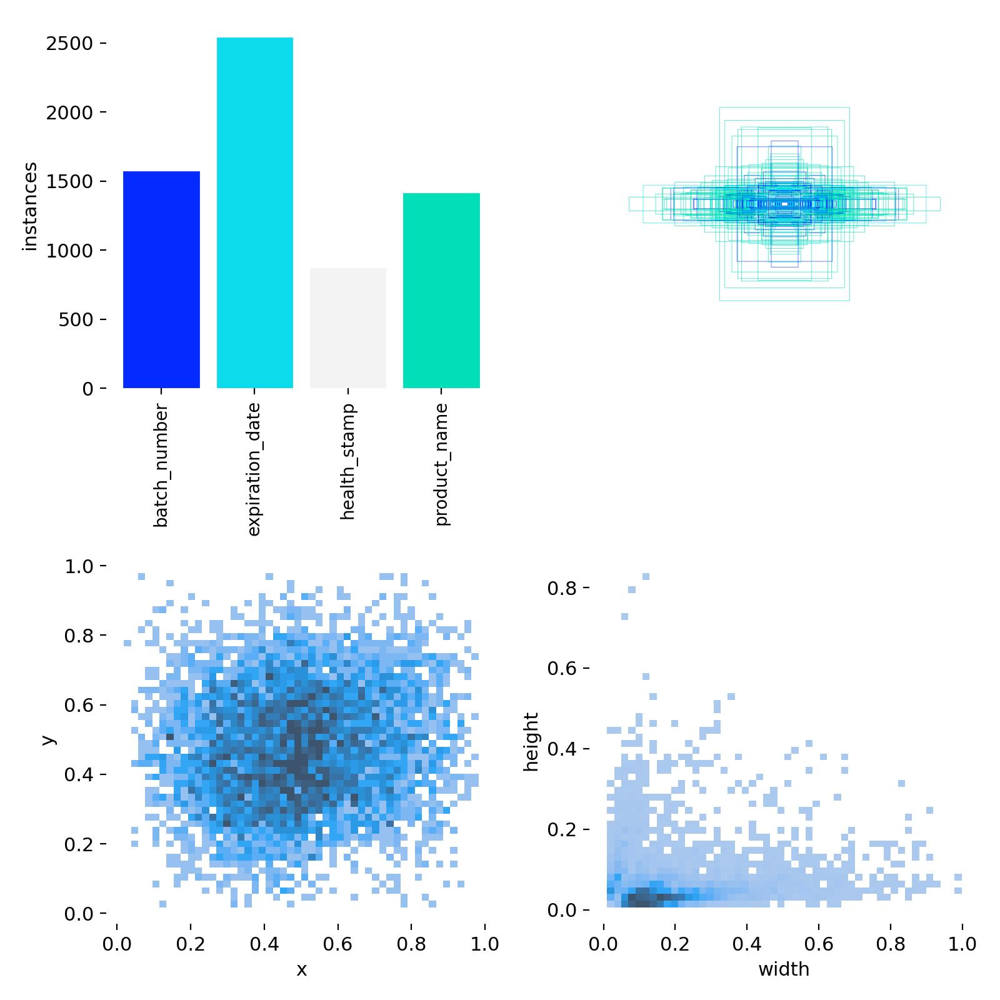

In [ ]:
labels=cv2.imread('/content/runs/detect/train/labels.jpg')
cv2_imshow(labels)

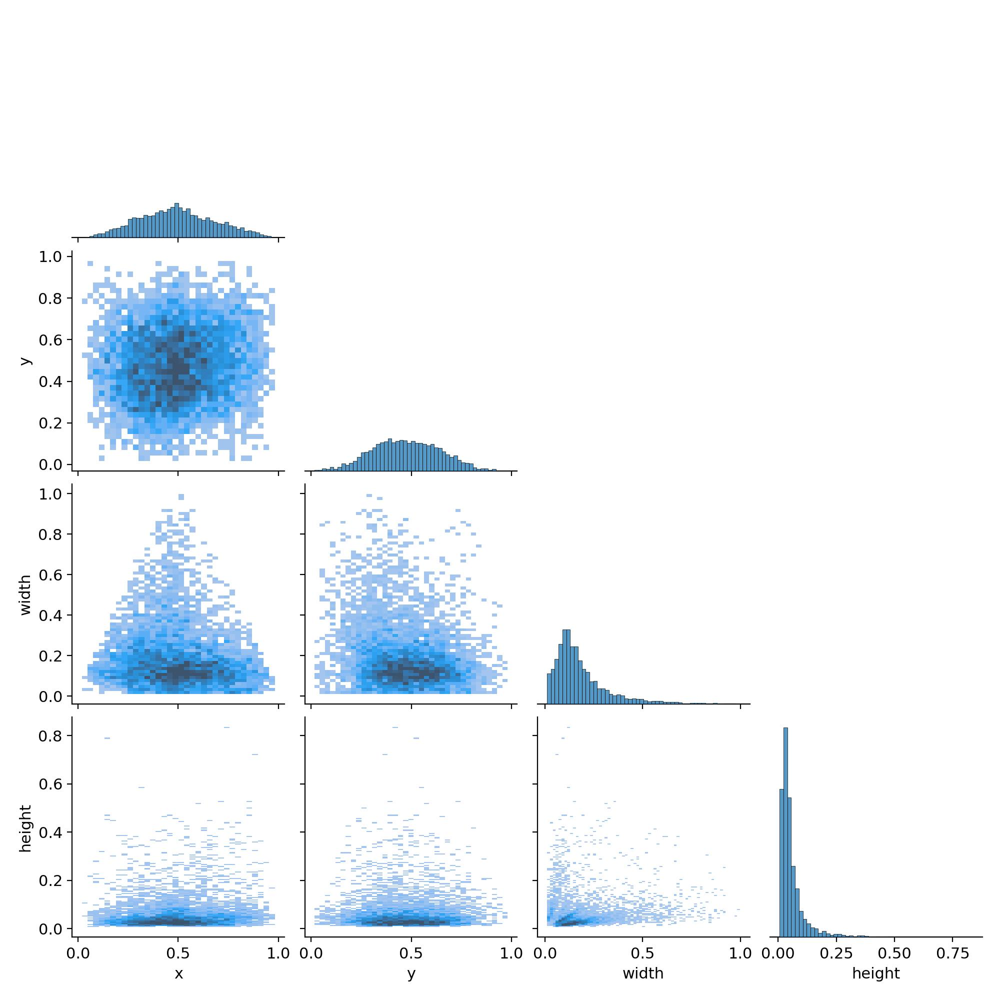

In [ ]:
labels_corr=cv2.imread('/content/runs/detect/train/labels_correlogram.jpg')
cv2_imshow(labels_corr)

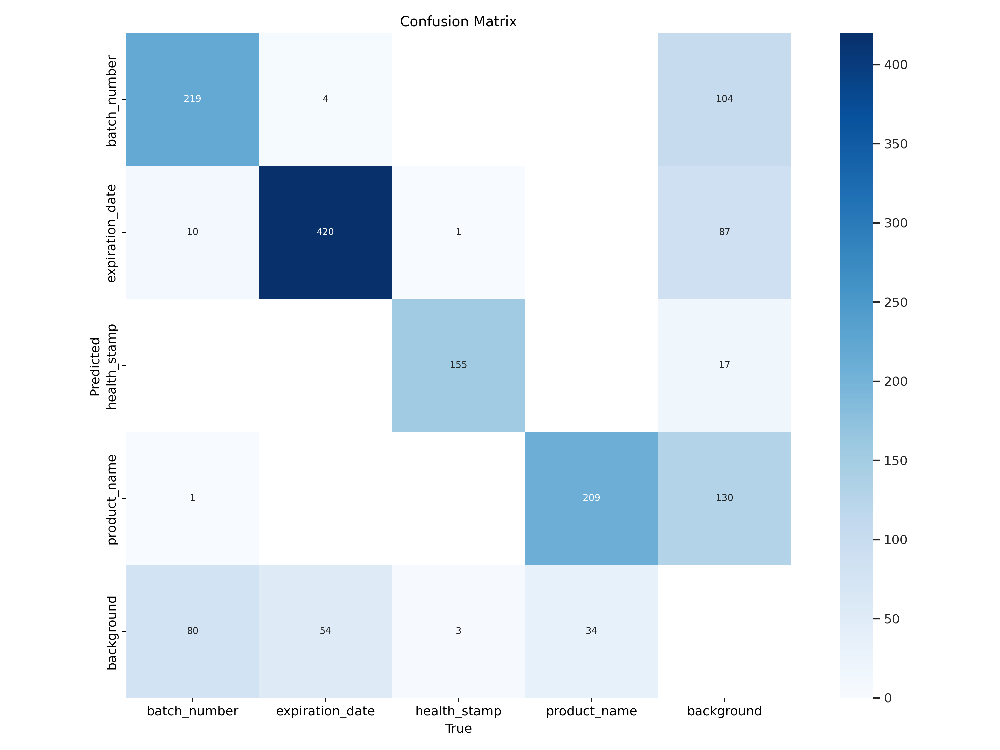

In [ ]:
cm=cv2.imread('/content/runs/detect/train/confusion_matrix.png')
cv2_imshow(cm)

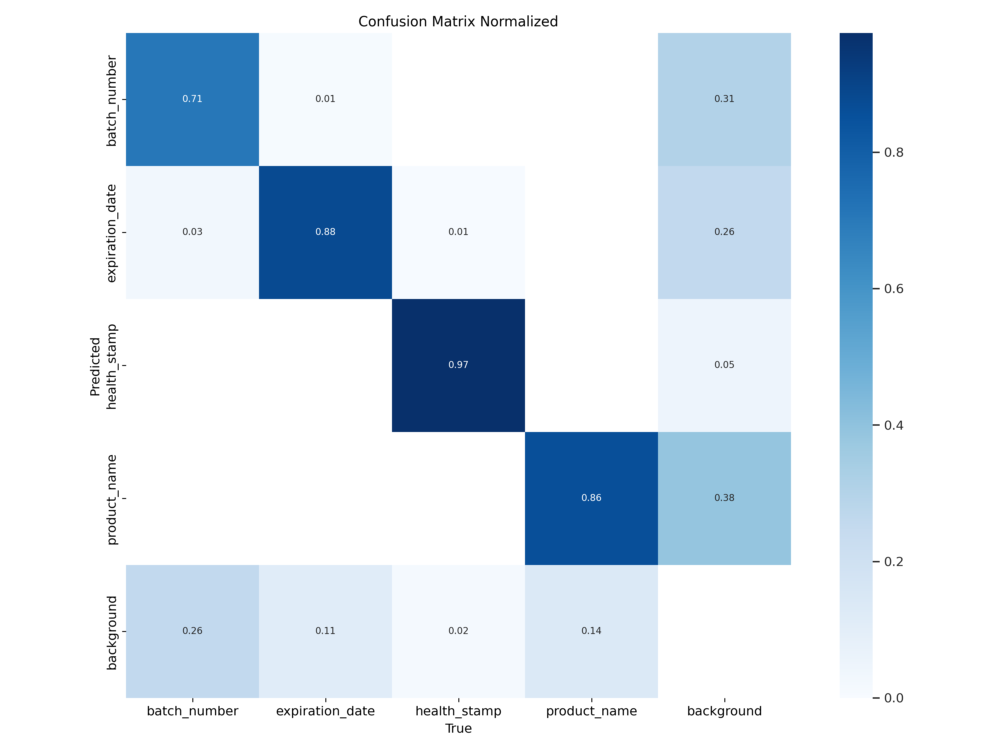

In [ ]:
ncm=cv2.imread('/content/runs/detect/train/confusion_matrix_normalized.png')
cv2_imshow(ncm)

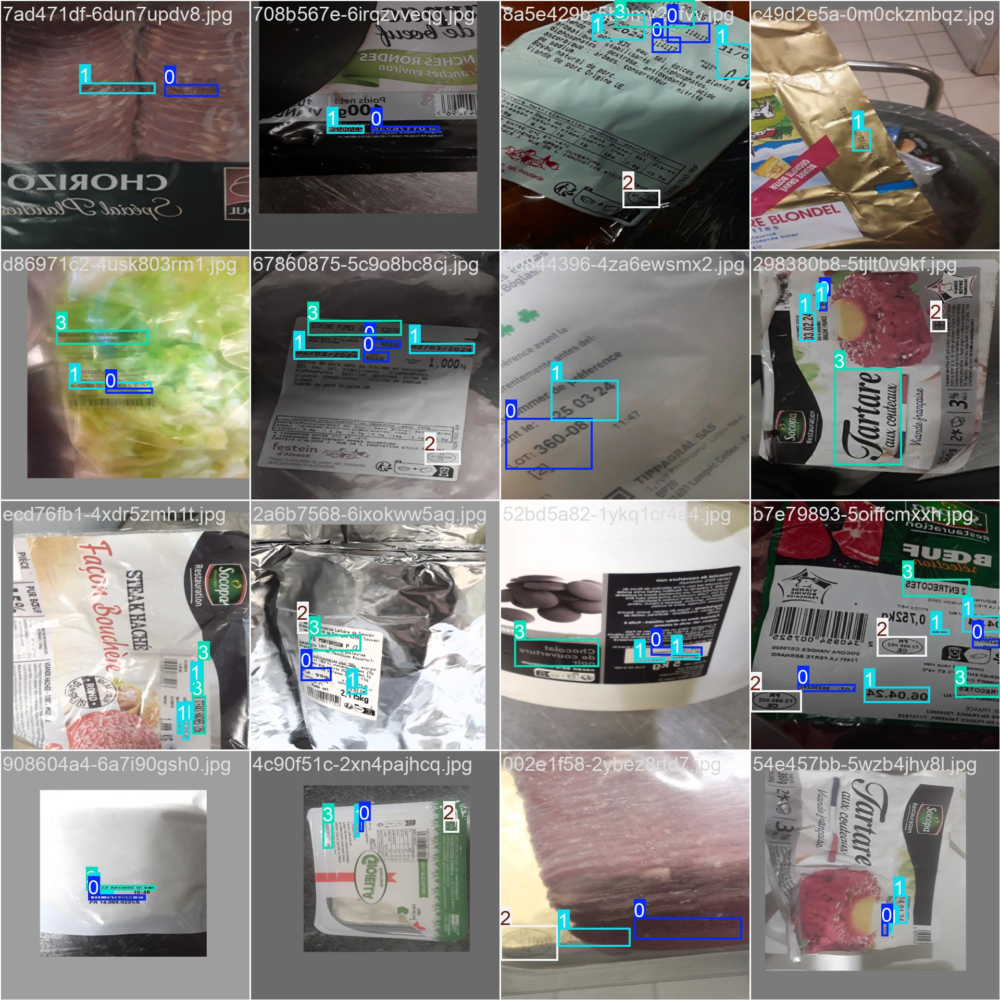

In [ ]:
train_batch=cv2.imread('/content/runs/detect/train/train_batch13020.jpg')
cv2_imshow(train_batch)

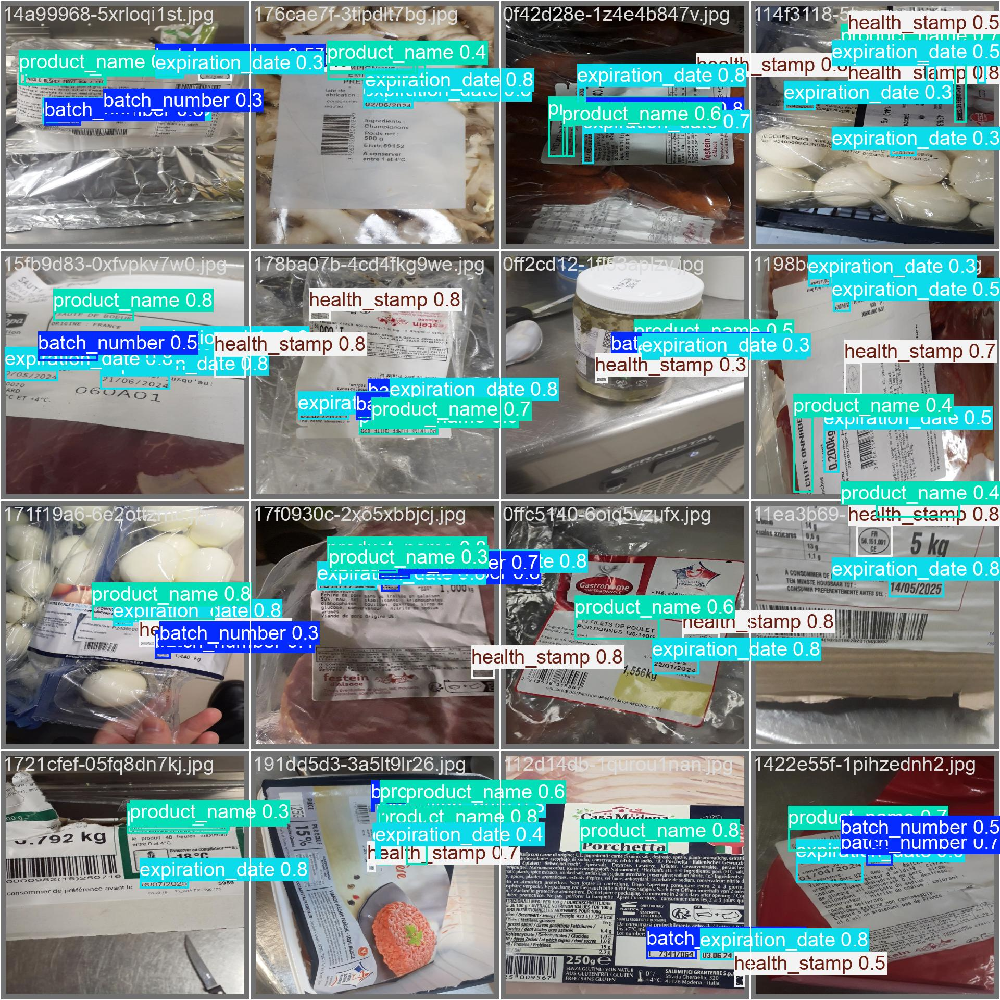

In [ ]:
val_pred=cv2.imread('/content/runs/detect/train/val_batch1_pred.jpg')
cv2_imshow(val_pred)

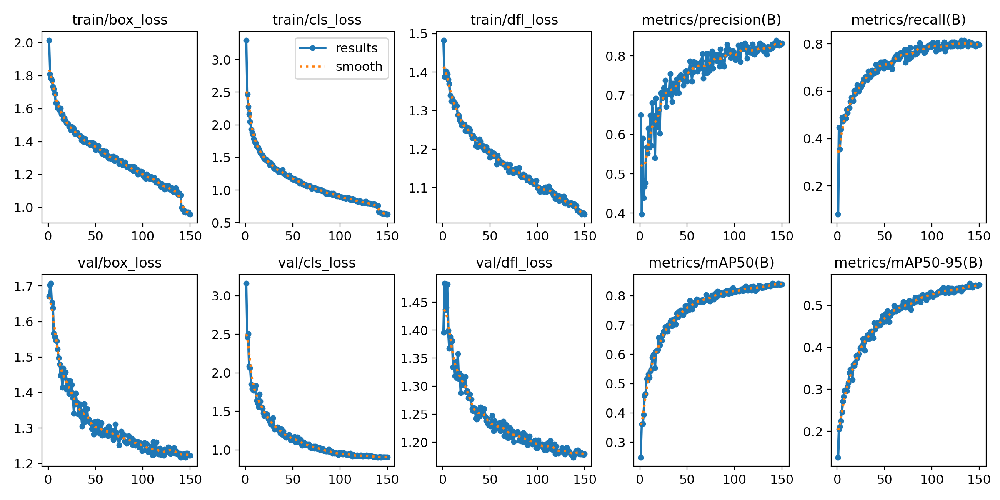

In [ ]:
results=cv2.imread('/content/runs/detect/train/results.png')
cv2_imshow(results)

# Test Prediction

**Try auto-annotation for one image**

In [ ]:
from ultralytics.data.annotator import auto_annotate

auto_annotate(
    data='/content/drive/MyDrive/lot4/dataset_split/test/images/e8d93fbc-04iovfmz7o.jpg',
    det_model='/content/drive/MyDrive/lot4/train/weights/best.pt',
    #sam_model='sam_b.pt',  # Optional: Use SAM for segmentation
    output_dir='/content/drive/MyDrive/lot4/dataset_split/test/predicted_labels'
)



image 1/1 /content/drive/MyDrive/lot4/dataset_split/test/images/e8d93fbc-04iovfmz7o.jpg: 640x640 (no detections), 1051.3ms
Speed: 2.8ms preprocess, 1051.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
folder_path = "/content/drive/MyDrive/lot4/dataset_split/test/images"
k=0
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    k=k+1
    txt_path='/content/drive/MyDrive/lot4/dataset_split/test/predicted_labels/'+filename.split('.')[0]+'.txt'
    if not os.path.exists(txt_path):
      print(file_path , 'number',k)
i=0
folder_path = "/content/drive/MyDrive/lot4/dataset_split/test/predicted_labels"
for filename in os.listdir(folder_path):
  i=i+1
print('theres ',i, 'files')




/content/drive/MyDrive/lot4/dataset_split/test/images/edb02df0-2fea137fg3.jpg number 26
/content/drive/MyDrive/lot4/dataset_split/test/images/a5654092-1cd19frf9t.jpg number 96
/content/drive/MyDrive/lot4/dataset_split/test/images/69f413c8-04n1hzuo4x.jpg number 132
/content/drive/MyDrive/lot4/dataset_split/test/images/5106c709-4cfzdmsalq.jpg number 241
/content/drive/MyDrive/lot4/dataset_split/test/images/e8d93fbc-04iovfmz7o.jpg number 273
theres  280 files


In [ ]:
with open('/content/drive/MyDrive/lot4/dataset_split/test/labels/01b39740-03yodbclsk.txt', 'r') as file:
    content = file.read()
    print(content)

3 0.6484972625929294 0.48721575070854667 0.18951518176231727 0.46038010485353115 0.17915107025969054 0.5316333714340898 0.6233272775151216 0.556618283092208
1 0.0026919770136694323 0.49430490392548143 -0.0013459885068344867 0.5210143633579813 0.13190687366979484 0.5321608306802056 0.14267478172447196 0.49346366110870976
1 0.7093359431018552 0.5708580002517015 0.4562901038169429 0.5531919010994969 0.4562901038169429 0.5792704284194181 0.717411874142863 0.598619013205166
1 0.5706991268978874 0.5952540419380794 0.4549441153101083 0.5876828565871346 0.44956016128276977 0.6120788982735124 0.5730264983232696 0.6172850973086984
0 0.328485180914613 0.6109647155147716 0.163925422207284 0.600047692416171 0.17955400264317556 0.6264783799180463 0.32572719613180867 0.6322241815488889
2 0.8736468396489488 0.6350970823643102 0.7541341657274251 0.6213071584502882 0.7476988679008814 0.6862347168788083 0.8810014657364271 0.6919805185096508



**Plot the image with prediction**

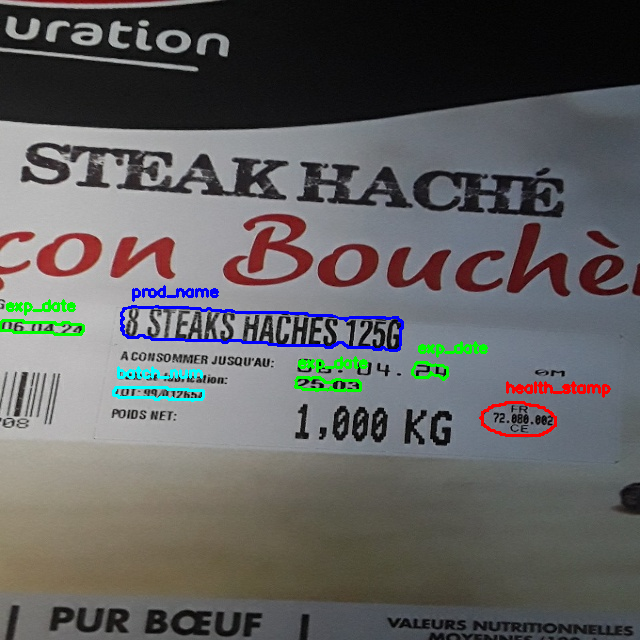

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
image = cv2.imread('/content/drive/MyDrive/lot4/dataset_split/test/images/01b39740-03yodbclsk.jpg')


# Read points from your text file (replace 'points.txt' with your actual file)
def read_points_from_file(file_path):
    points = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            label_id = int(parts[0])
            coordinates = [float(coord) for coord in parts[1:]]
            points.append((label_id, coordinates))
    return points

# Create polygons from the points
def create_polygons(points):
    polygons = []
    for label_id, coords in points:
        polygon = np.array(coords).reshape(int(len(coords)/2), 2)
        polygons.append((label_id, polygon))
    return polygons

# Plot polygons with labels
def plot_polygons(polygons):
    plt.figure(figsize=(8, 6))
    for label_id, polygon in polygons:
        plt.plot(polygon[:, 0], polygon[:, 1], marker='o', linestyle='-', label=f'Label {label_id}')
        plt.fill(polygon[:, 0], polygon[:, 1], alpha=0.3)

    # Add labels on top of polygons
    for label_id, polygon in polygons:
        centroid = np.mean(polygon, axis=0)
        plt.text(centroid[0], centroid[1], f'Label {label_id}', fontsize=10, ha='center', va='center')

    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Polygons with Labels')
    plt.grid(True)
    plt.legend()
    plt.show()


file_path = '/content/drive/MyDrive/lot4/dataset_split/test/predicted_labels/01b39740-03yodbclsk.txt'  # Replace with your actual file path
points = read_points_from_file(file_path)
# print (points)
poly=create_polygons(points)
# print(poly)

for i in range(len(poly)):
  for j in poly[i][1]:



    j[0]=int(j[0] * image.shape[1])
    j[1]=int( j[1]* image.shape[0])


for i in range(len(poly)):
  j=poly[i][1]
  # print(j)
  int_poly = np.array(j).astype(int)
  # print(int_poly)
  if poly[i][0]==1:
    cv2.polylines(image, [int_poly], isClosed=True, color=(0, 255, 0), thickness=2)
    cv2.putText(image, 'exp_date', (int(int_poly[0][0]), int(int_poly[0][1])- 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
  if poly[i][0]==2:
    cv2.polylines(image, [int_poly], isClosed=True, color=(0, 0, 255), thickness=2)
    cv2.putText(image, 'health_stamp', (int(int_poly[0][0]), int(int_poly[0][1])- 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
  if poly[i][0]==3:
    cv2.polylines(image, [int_poly], isClosed=True, color=(255, 0, 0), thickness=2)
    cv2.putText(image, 'prod_name', (int(int_poly[0][0]), int(int_poly[0][1])- 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
  if poly[i][0]==0:
    cv2.polylines(image, [int_poly], isClosed=True, color=(255, 255, 0), thickness=2)
    cv2.putText(image, 'batch_num', (int(int_poly[0][0]), int(int_poly[0][1])- 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 2)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()




**Auto-annotation of all test images**

In [4]:
from ultralytics.data.annotator import auto_annotate

auto_annotate(
    data='/content/drive/MyDrive/data/data1_300',
    det_model='/content/drive/MyDrive/lot4/train/weights/best.pt',

    output_dir='/content/drive/MyDrive/data/data1_300_pedictions'
)

100%|██████████| 358M/358M [00:05<00:00, 63.3MB/s]



image 1/300 /content/drive/MyDrive/data/data1_300/0zjk8rwzzl.jpg: 640x416 3 batch_numbers, 1410.6ms
image 2/300 /content/drive/MyDrive/data/data1_300/0zs87wjlf8.jpg: 416x640 1 expiration_date, 1 product_name, 396.2ms
image 3/300 /content/drive/MyDrive/data/data1_300/0zvm112y90.jpg: 640x416 2 batch_numbers, 1 expiration_date, 1 product_name, 744.4ms
image 4/300 /content/drive/MyDrive/data/data1_300/1i0jwzum20.jpg: 640x416 1 health_stamp, 672.6ms
image 5/300 /content/drive/MyDrive/data/data1_300/1ik37uqxac.jpg: 416x640 2 product_names, 337.7ms
image 6/300 /content/drive/MyDrive/data/data1_300/1ilhynio4v.jpg: 640x416 1 expiration_date, 1 health_stamp, 1 product_name, 552.5ms
image 7/300 /content/drive/MyDrive/data/data1_300/1iocm6zyhz.jpg: 640x416 1 expiration_date, 513.5ms
image 8/300 /content/drive/MyDrive/data/data1_300/1ip8v7t4vf.jpg: 416x640 1 expiration_date, 1 product_name, 335.1ms
image 9/300 /content/drive/MyDrive/data/data1_300/1ipci84kwh.jpg: 640x416 (no detections), 377.4ms
i

KeyboardInterrupt: 

In [5]:
img=cv2.imread('/content/drive/MyDrive/data/data1_300/1w9ay0x3xx.jpg')
cv2_imshow(img)

AttributeError: 'NoneType' object has no attribute 'clip'

In [ ]:
from PIL import Image
import os

def count_damaged_images(directory):
    damaged_count = 0

    # Loop through each file in the directory
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)

        # Check if it's a file (not a directory)
        if os.path.isfile(filepath):
            try:
                # Try to open the image
                with Image.open(filepath) as img:
                    # You can optionally check if the image has a valid format
                    img.verify()
            except (IOError, SyntaxError) as e:
                # Increment the count if the image is unreadable or damaged
                damaged_count += 1
                print(f"Damaged or unreadable image: {filepath}")

    return damaged_count

# Replace 'your_image_directory' with the path to your directory of images
directory = 'your_image_directory'
damaged_images = count_damaged_images(directory)
print(f"Number of damaged or unreadable images: {damaged_images}")
